# Unit-wget model trained on MPI and Era
# Decoded response to single filter substitutions (viz via bubble plots) and Filter contributions 

## SGP: storm 1 (MPI 1950-223), storm 2 (MPI 1950-262)

### TOC
 [1. Bubble plots](#bp)<br>
 [2. Filter variance](#fv)<br>
 





### Calculate per-variable variance (also does average variance)

In [37]:
def calc_err_list(input_chunk, bn_mean_era, gen):
    
    # avg_decoded: ERA
    generated_chunk = gen.decode(bn_mean_era).detach().numpy()
    avg_decoded = generated_chunk[0]
    generated_chunk_denorm = generated_chunk * (minmaxi_era[:,1]-minmaxi_era[:,0])[np.newaxis,:,np.newaxis,np.newaxis] + minmaxi_era[:,0][np.newaxis,:,np.newaxis,np.newaxis]
    avg_decoded_denorm = generated_chunk_denorm[0]

    # front_encoded/decoded
    encoded_extreme = gen.encode(input_chunk)[0].detach()
    generated_chunk = gen.decode(encoded_extreme).detach().numpy()
    front_decoded = generated_chunk[0]
    generated_chunk_denorm = generated_chunk * (minmaxi_era[:,1]-minmaxi_era[:,0])[np.newaxis,:,np.newaxis,np.newaxis] + minmaxi_era[:,0][np.newaxis,:,np.newaxis,np.newaxis]
    front_decoded_denorm = generated_chunk_denorm[0]

    err1_list_era = []   # deviation from bottle neck mean
    err2_list_era = []
    for ff in range(512):
    #     print(ff)
    #     fig, axarr = plt.subplots(1, 4, figsize = (5,5))
    #     plot = axarr[0].imshow(encoded_extreme.detach().numpy()[0,ff,::-1,:])
    #     plot = axarr[1].imshow((encoded_extreme.detach().numpy()-bn_mean_era.numpy())[0,ff,::-1,:])
    #     plot = axarr[2].imshow(bn_mean_era.detach().numpy()[0,ff,::-1,:])
    #     plot = axarr[3].imshow((bn_mean_era.detach().numpy()-encoded_extreme.numpy())[0,ff,::-1,:])
    #     plt.show()

        # col3
        newbn = encoded_extreme.clone()
        newbn[0,ff,:,:] = bn_mean_era[0,ff,:,:].clone()
        generated_chunk = gen.decode(newbn).detach().numpy()
        generated_chunk_denorm = generated_chunk * (minmaxi_era[:,1]-minmaxi_era[:,0])[np.newaxis,:,np.newaxis,np.newaxis] + minmaxi_era[:,0][np.newaxis,:,np.newaxis,np.newaxis]
        generated_chunk_denorm = generated_chunk_denorm[0]
        #err = float(mse(torch.tensor(generated_chunk_denorm), torch.tensor(front_decoded_denorm)).detach())
        #err18 = [round_sig(float(mse(torch.tensor(generated_chunk_denorm[ii]), torch.tensor(front_decoded_denorm[ii])).detach())) for ii in range(18)]
        err = float(mae(torch.tensor(generated_chunk[0]), torch.tensor(front_decoded)).detach())
        err18 = [round_sig(float(mae(torch.tensor(generated_chunk[0][ii]), torch.tensor(front_decoded[ii])).detach())) for ii in range(18)]
        #print('avg err:', err)
        #print('err18:', err18)
        #err1_list_era.append([err, [ff, generated_chunk.copy()]])
        err1_list_era.append([err, err18, ff, front_decoded_denorm - generated_chunk_denorm])
        svars=[8,9,10,11,12,13,14,15]
        #plot_8v_abs_surf_192x256(np.array(generated_chunk), 'Surf: a2a (mpi2mpi)', vmin, vmax, svars=svars, xoff=64, yoff=64)


        # col4
        newbn = bn_mean_era.clone()
        newbn[0,ff,:,:] = encoded_extreme[0,ff,:,:].clone()
        generated_chunk = gen.decode(newbn).detach().numpy()
        generated_chunk_denorm = generated_chunk * (minmaxi_era[:,1]-minmaxi_era[:,0])[np.newaxis,:,np.newaxis,np.newaxis] + minmaxi_era[:,0][np.newaxis,:,np.newaxis,np.newaxis]
        generated_chunk_denorm = generated_chunk_denorm[0]
        #err = float(mse(torch.tensor(generated_chunk_denorm), torch.tensor(avg_decoded_denorm)).detach())
        #err18 = [round_sig(float(mse(torch.tensor(generated_chunk_denorm[ii]), torch.tensor(avg_decoded_denorm[ii])).detach())) for ii in range(18)]
        err = float(mae(torch.tensor(generated_chunk[0]), torch.tensor(avg_decoded)).detach())
        err18 = [round_sig(float(mae(torch.tensor(generated_chunk[0][ii]), torch.tensor(avg_decoded[ii])).detach())) for ii in range(18)]
        #print('front err', err)
        #print('err18:', err18)
        #err2_list_era.append([err, [ff, generated_chunk.copy()]])
        err2_list_era.append([err, err18, ff, avg_decoded_denorm - generated_chunk_denorm])
        svars=[8,9,10,11,12,13,14,15]
        #plot_8v_abs_surf_192x256(np.array(generated_chunk), 'Surf: a2a (mpi2mpi)', vmin, vmax, svars=svars, xoff=64, yoff=64)
    return err1_list_era, err2_list_era


### Buble plots for ALL storm days

In [38]:
def bubble_plot(top15_filters_era, err1_list_era):
    # Plot
    ffii = 0
    for ff in top15_filters_era[0:15]:
        ffii += 1
        sizes = []
        for vv in range(18):
            xx = list(err1_list_era[ff])
            fvar = xx[1][vv]
            sizes.append(fvar*5000)
        plt.scatter([1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18],np.ones((18))*(16-ffii), s=sizes)
    plt.xticks([1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18], ['U8', 'V8', 'Q8', 'T7', 'Z7', 'Z5', 'U2', 'V2', 'pr', 'tx', 'tn', 'u', 'v', 'h', 'rs', 'or', 'ms', 'yd'])
    plt.yticks([1,2,3,4,5,6,7,8,9,10,11,12,13,14,15], ['15', '14', '13', '12', '11', '10', '9', '8', '7', '6', '5', '4', '3', '2', '1'])
    plt.legend([str(x) for x in top15_filters_era], bbox_to_anchor=(1.0, 1.05), title='Filter:')
    plt.show()
    

In [39]:
def plot_activation(top15_filters_era, input_chunk, bn_mean_era, gen):
    # front_encoded
    encoded_extreme = gen.encode(input_chunk)[0].detach()

    # diff
    diff = encoded_extreme - bn_mean_era
    print(diff.shape)
    
    fig, axarr = plt.subplots(1, 15, figsize = (20,20))
    #fig, axarr = plt.subplots(1, 15, figsize = (20,20), subplot_kw={'projection': ccrs.PlateCarree()})
    #lon = dv1[0].lon
    #lat = dv1[0].lat

    for ii in range(15):
        #axarr[ii].coastlines()
        #axarr[ii].add_feature(cfeature.STATES)
        #img_extent = (lon.min(), lon.max(), lat.min(), lat.max())
        
        plot = axarr[ii].imshow(diff[0,top15_filters_era[ii]].numpy()[:,::-1])
        axarr[ii].axis('off')
        axarr[ii].title.set_text(top15_filters_era[ii])
    plt.show()


In [79]:
def show_storm(ii, storms=storms, xoff=20, yoff=58):
    input_chunk = storms[ii:ii+1, :, yoff:yoff+64, xoff:xoff+64]

    # denorm
    input_img_denorm = input_chunk * (minmaxi_era[:,1]-minmaxi_era[:,0])[np.newaxis,:,np.newaxis,np.newaxis] + minmaxi_era[:,0][np.newaxis,:,np.newaxis,np.newaxis]
    raw_era = np.array(input_img_denorm)[0]
    raw_era[np.isnan(raw_era)] = 0.   # extended surface domain has nan's at bottom
    #raw_era[8:] = (raw_era * mask)[8:]

    # ^4 prec
    raw_era[8] = raw_era[8] ** 4

    vmin = [raw_era[ii].min() for ii in range(18)]
    vmax = [raw_era[ii].max() for ii in range(18)]

    svars = [0,1,2,3,4,5,6,7,17]
    plot_9v_192x256_abs(raw_era, None, vmin, vmax, svars=svars, xoff=xoff, yoff=yoff)
    svars = [8,9,10,11,12,13,14,15,16]
    plot_9v_192x256_abs(raw_era, None, vmin, vmax, svars=svars, xoff=xoff, yoff=yoff)


<a id='bp'></a>
### MPI Storms

/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:15: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  from ipykernel import kernelapp as app


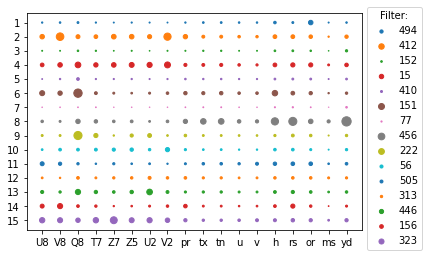

torch.Size([1, 512, 8, 8])


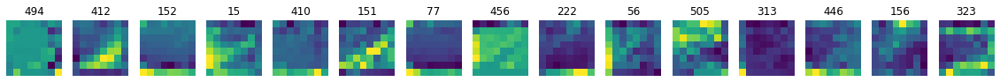

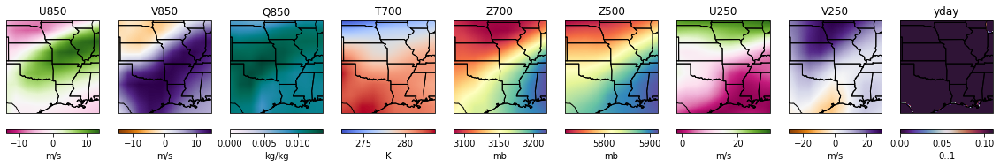

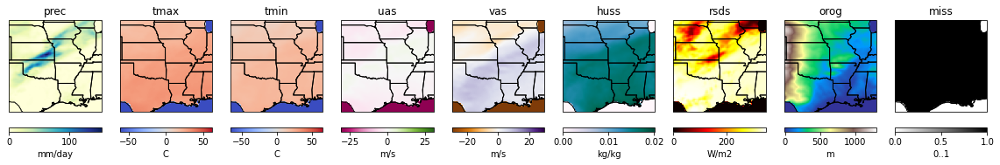

/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:15: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  from ipykernel import kernelapp as app


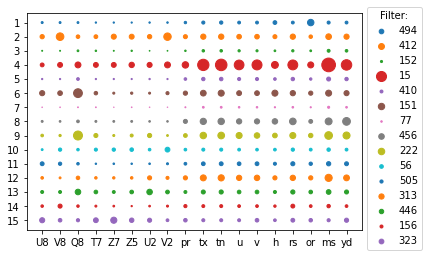

torch.Size([1, 512, 8, 8])


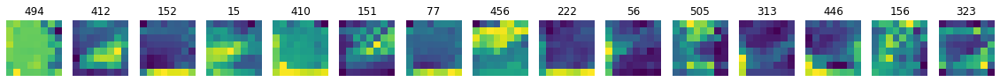

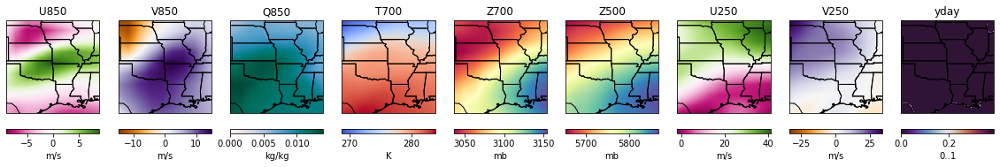

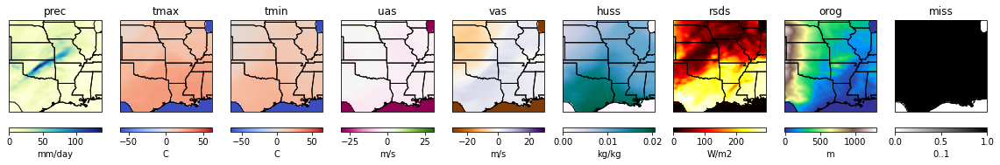

In [84]:
# MPI extreme day

# ii = 222
# #day_input = samples_mpi[261:262] # interesting day with front
# #day_input = samples_mpi[222:223] # interesting day with front

# input_chunk = samples_mpi[ii:ii+1, :, 58:58+64, 110:110+64]
# input_chunk[np.isnan(input_chunk)] = 0.   # extended surface domain has nan's at bottom
# encoded = gen_a.encode(input_chunk)[0].detach()

for ii in [222, 261]:
    # MPI extreme day
    input_chunk = samples_mpi[ii:ii+1, :, 58:58+64, 110:110+64]

    input_chunk[np.isnan(input_chunk)] = 0.   # extended surface domain has nan's at bottom
    err1_list_mpi, err2_list_mpi = calc_err_list(input_chunk, bn_mean_mpi, gen_a)
    
    # Plot
    bubble_plot(top15_filters_era, err1_list_mpi)
    
    plot_activation(top15_filters_era, input_chunk, bn_mean_mpi, gen_a)
    
    show_storm(ii, storms=samples_mpi, xoff=110, yoff=58)


### Visualize filters

In [59]:
def calc_filter_variance(input_chunk, bn_mean_era, gen, ff):
    
    # avg_decoded: ERA
    generated_chunk = gen.decode(bn_mean_era).detach().numpy()
    avg_decoded = generated_chunk[0]
    generated_chunk_denorm = generated_chunk * (minmaxi_era[:,1]-minmaxi_era[:,0])[np.newaxis,:,np.newaxis,np.newaxis] + minmaxi_era[:,0][np.newaxis,:,np.newaxis,np.newaxis]
    avg_decoded_denorm = generated_chunk_denorm[0]

    # front_encoded/decoded
    encoded_extreme = gen.encode(input_chunk)[0].detach()
    generated_chunk = gen.decode(encoded_extreme).detach().numpy()
    front_decoded = generated_chunk[0]
    generated_chunk_denorm = generated_chunk * (minmaxi_era[:,1]-minmaxi_era[:,0])[np.newaxis,:,np.newaxis,np.newaxis] + minmaxi_era[:,0][np.newaxis,:,np.newaxis,np.newaxis]
    front_decoded_denorm = generated_chunk_denorm[0]

    # deviation from bottle neck mean
    newbn = encoded_extreme.clone()
    newbn[0,ff,:,:] = bn_mean_era[0,ff,:,:].clone()
    generated_chunk = gen.decode(newbn).detach().numpy()
    generated_chunk_denorm = generated_chunk * (minmaxi_era[:,1]-minmaxi_era[:,0])[np.newaxis,:,np.newaxis,np.newaxis] + minmaxi_era[:,0][np.newaxis,:,np.newaxis,np.newaxis]
    generated_chunk_denorm = generated_chunk_denorm[0]
    #err = float(mse(torch.tensor(generated_chunk_denorm), torch.tensor(front_decoded_denorm)).detach())
    #err18 = [round_sig(float(mse(torch.tensor(generated_chunk_denorm[ii]), torch.tensor(front_decoded_denorm[ii])).detach())) for ii in range(18)]
    err = float(mae(torch.tensor(generated_chunk[0]), torch.tensor(front_decoded)).detach())
    err18 = [round_sig(float(mae(torch.tensor(generated_chunk[0][ii]), torch.tensor(front_decoded[ii])).detach())) for ii in range(18)]
    #print('avg err:', err)
    #print('err18:', err18)
    #err1_list_era.append([err, [ff, generated_chunk.copy()]])

    return [err, err18, ff, front_decoded_denorm - generated_chunk_denorm]



<a id='fv'></a>
#### Visualize MPI storm filters


STORM INDEX: 222


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  


FILTER 494


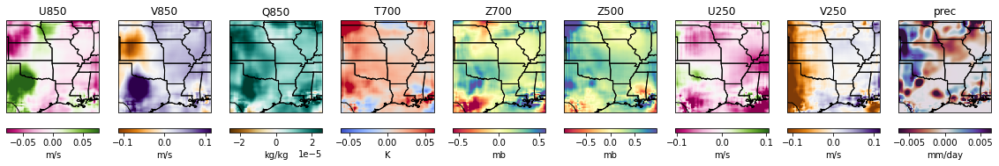

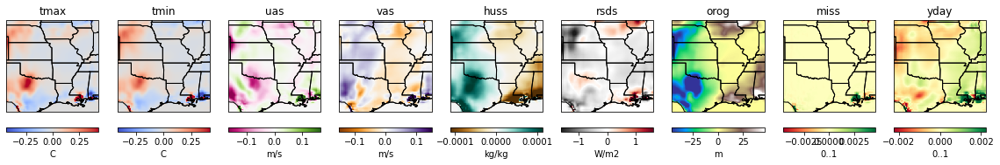

FILTER 412


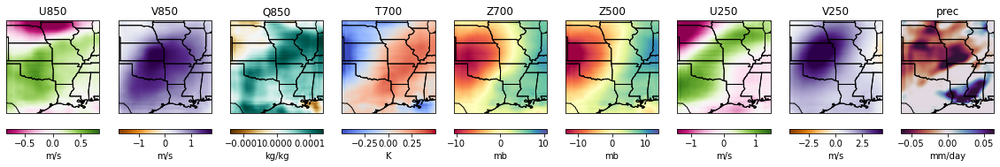

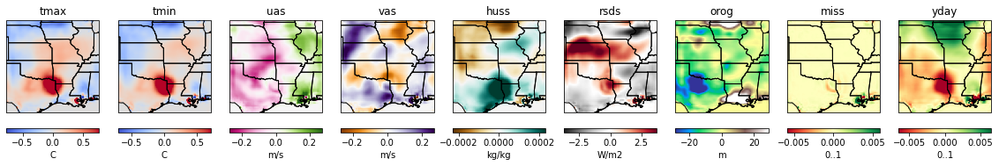

FILTER 152


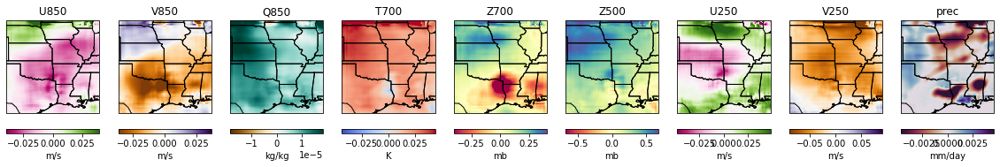

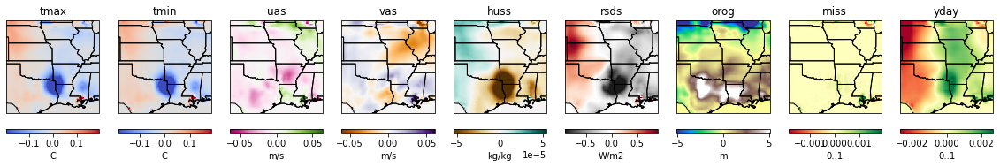

FILTER 15


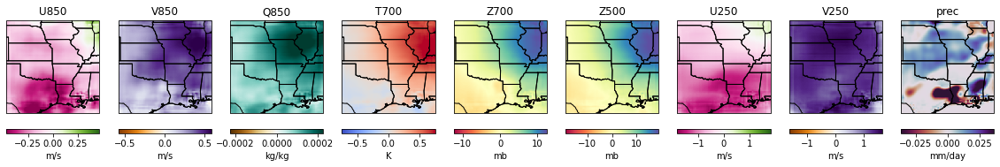

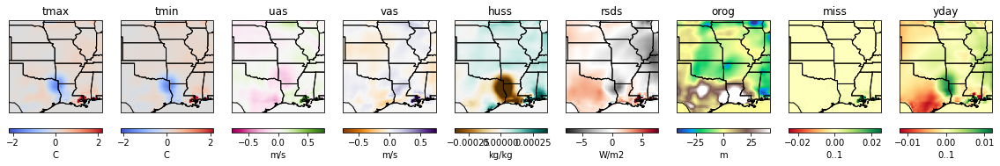

FILTER 410


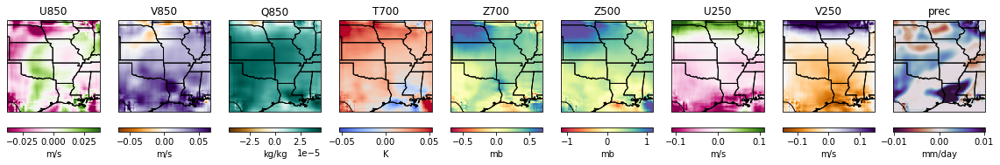

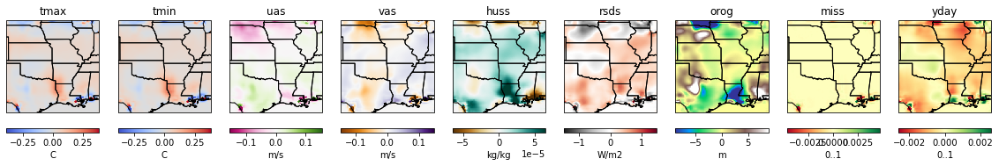

FILTER 151


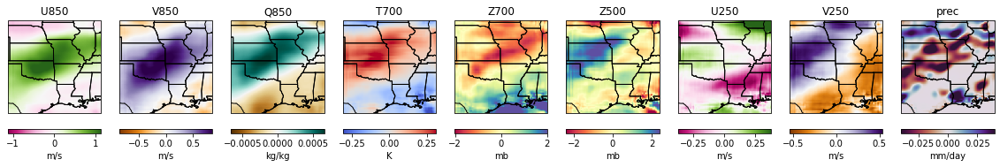

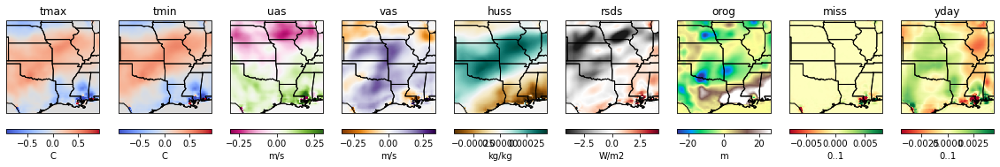

FILTER 77


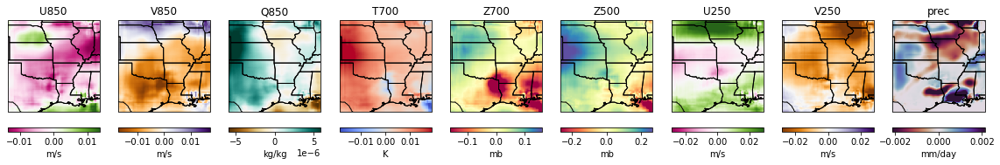

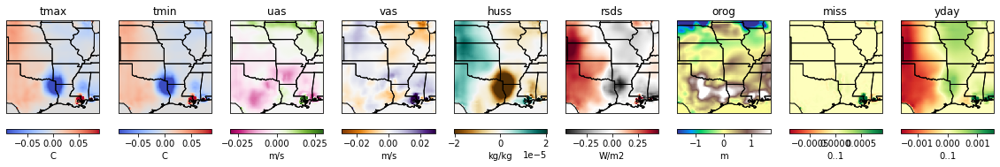

FILTER 456


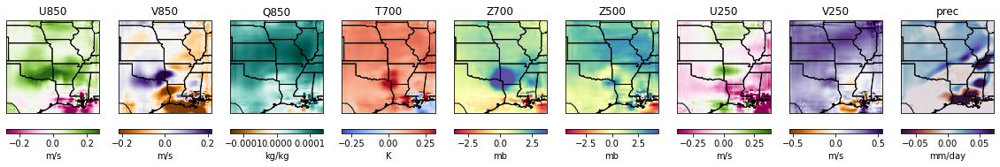

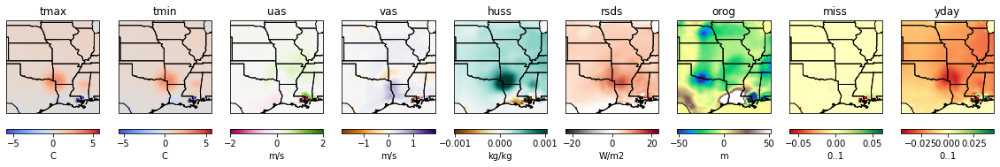

FILTER 222


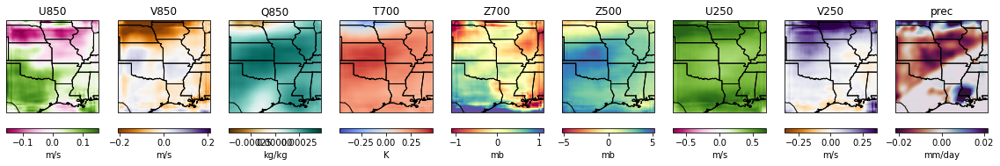

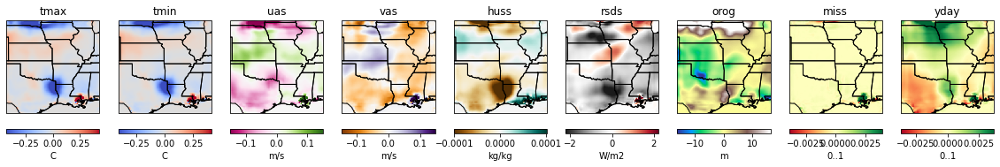

FILTER 56


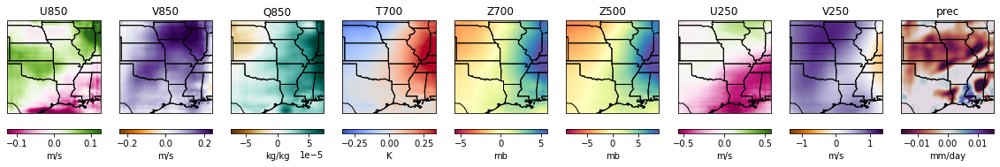

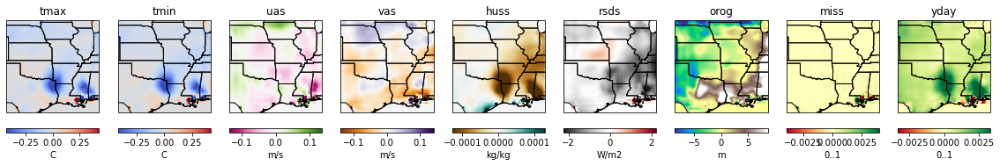

FILTER 505


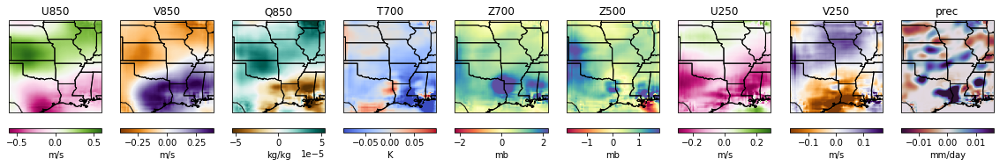

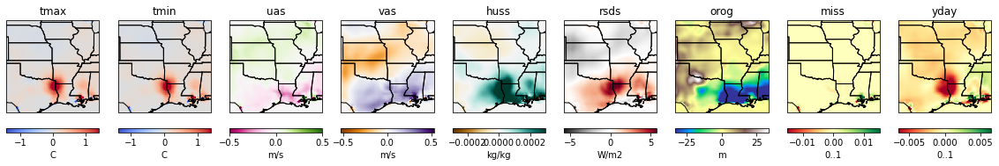

FILTER 313


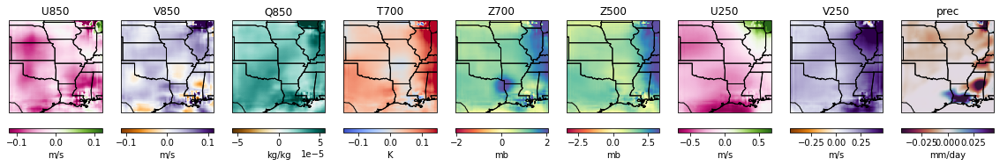

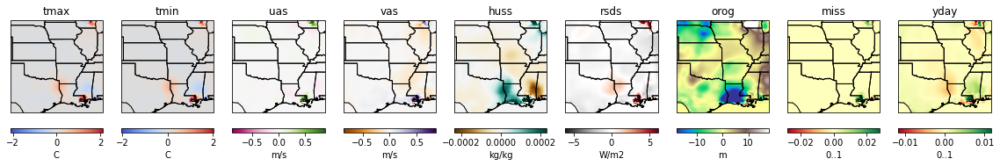

FILTER 446


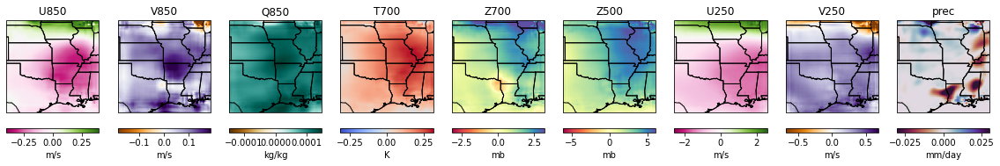

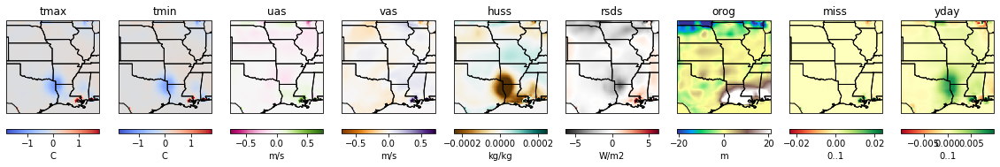

FILTER 156


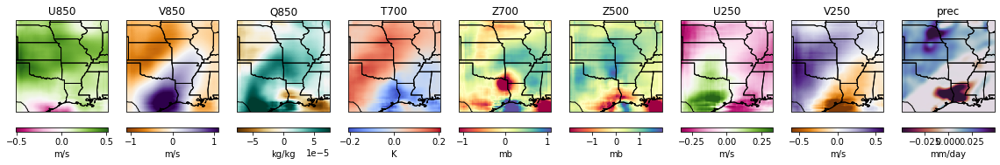

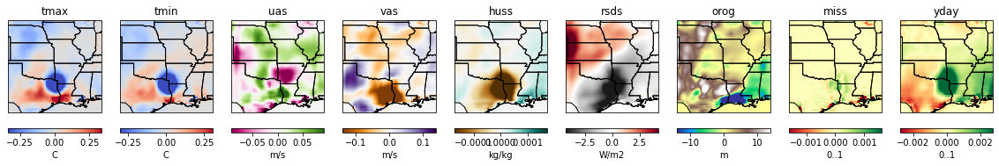

FILTER 323


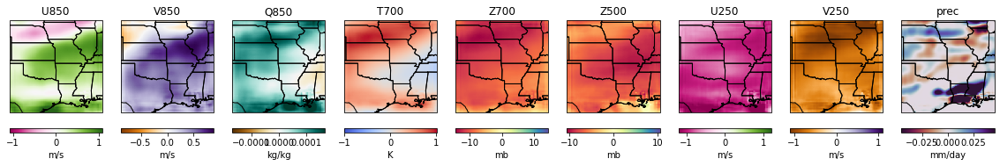

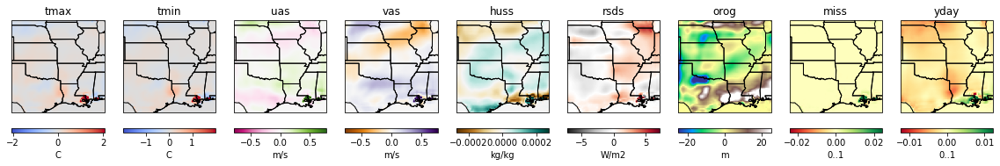


STORM INDEX: 261


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  


FILTER 494


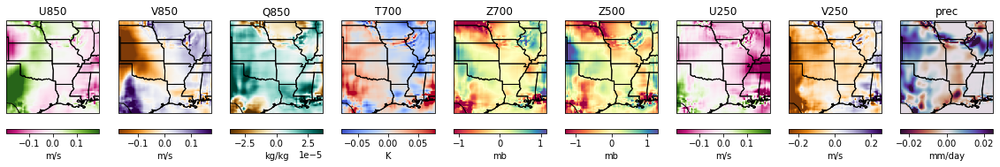

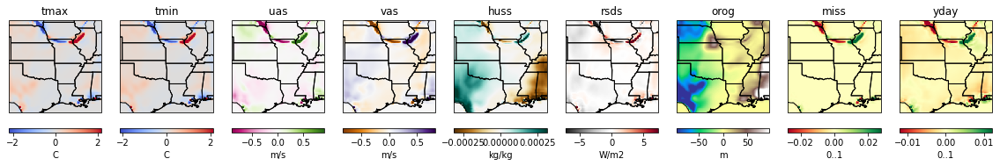

FILTER 412


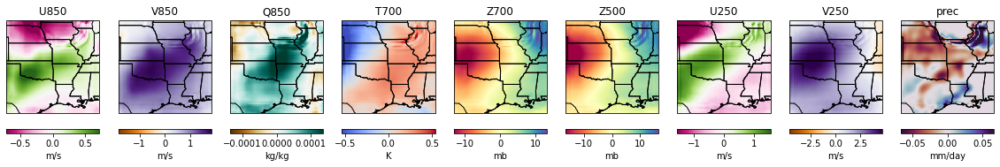

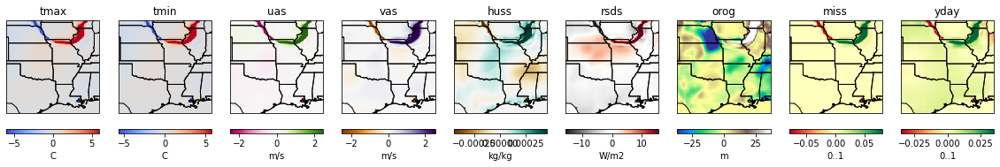

FILTER 152


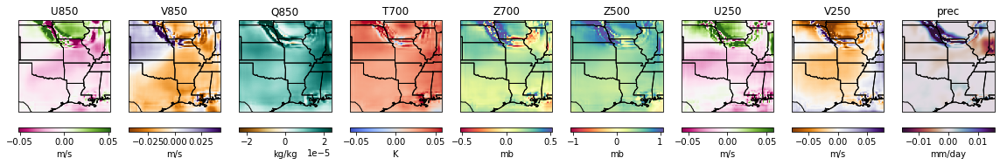

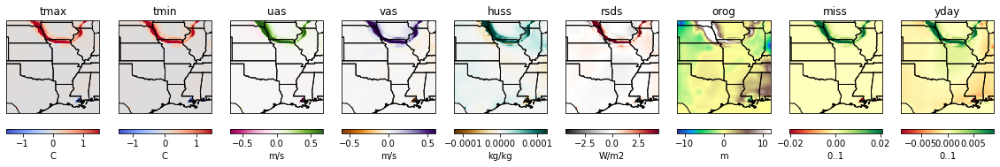

FILTER 15


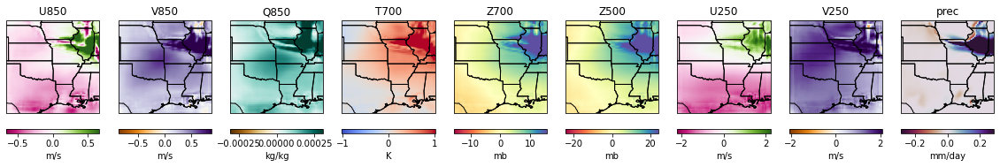

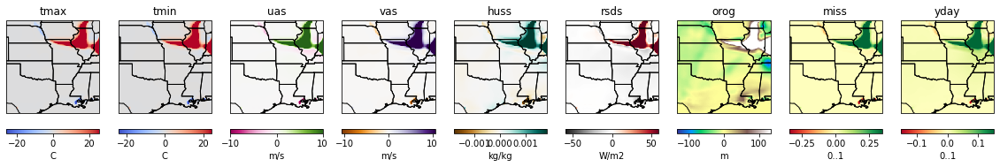

FILTER 410


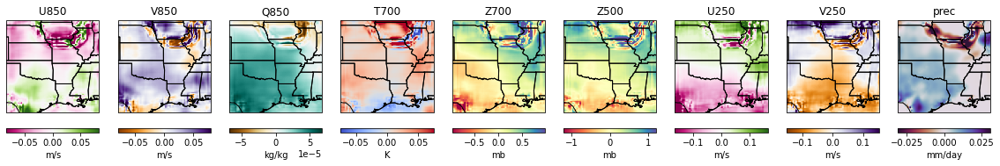

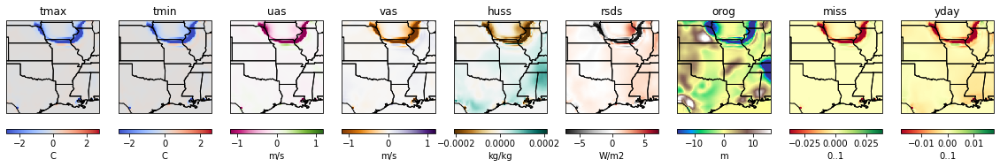

FILTER 151


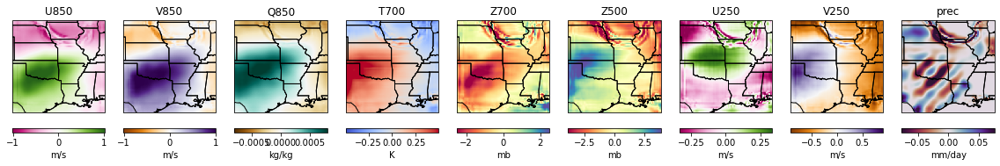

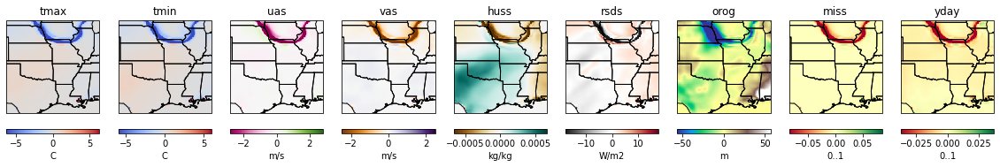

FILTER 77


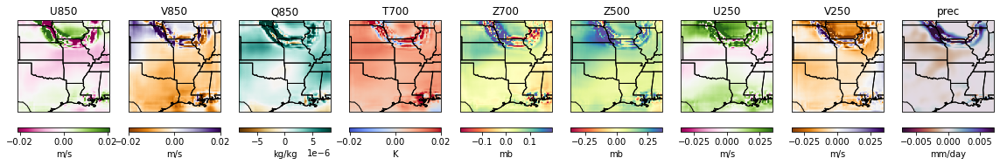

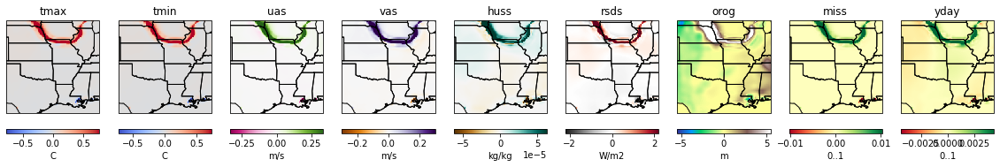

FILTER 456


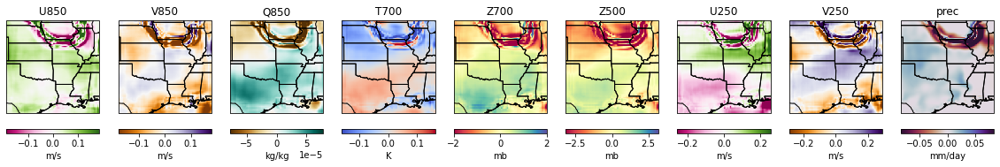

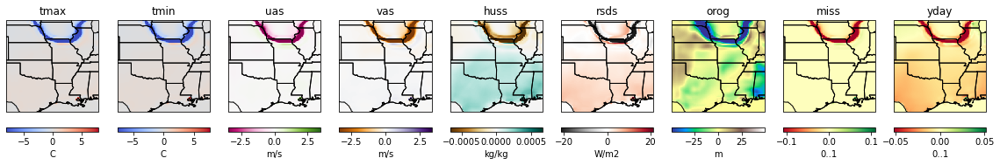

FILTER 222


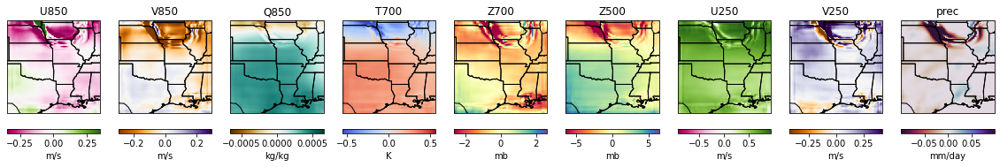

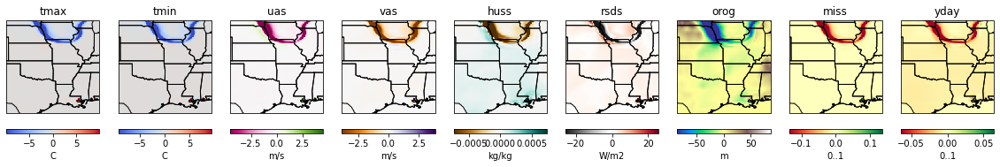

FILTER 56


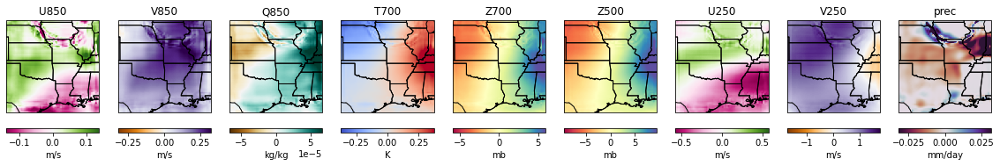

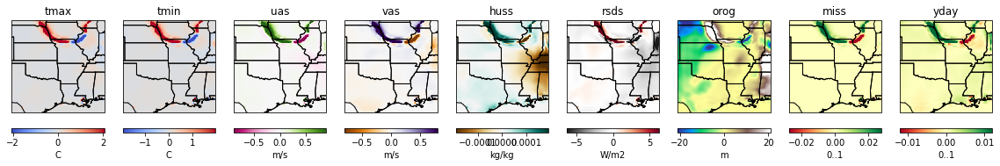

FILTER 505


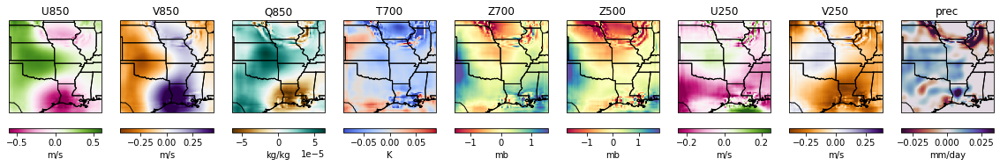

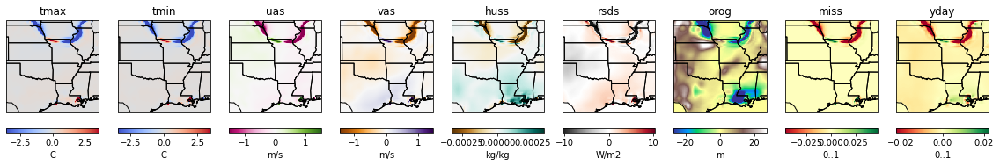

FILTER 313


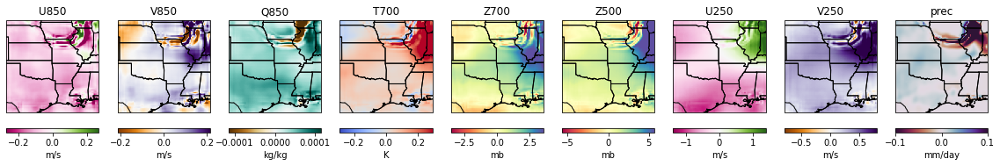

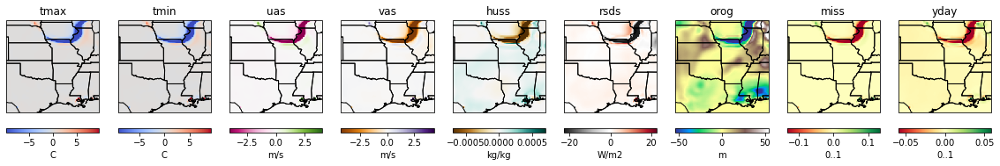

FILTER 446


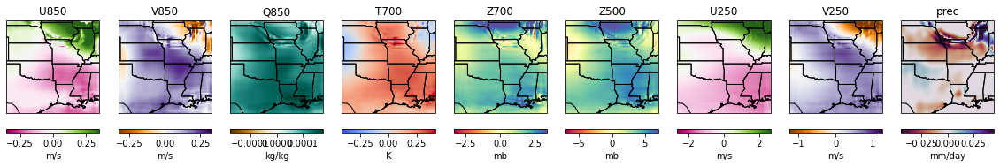

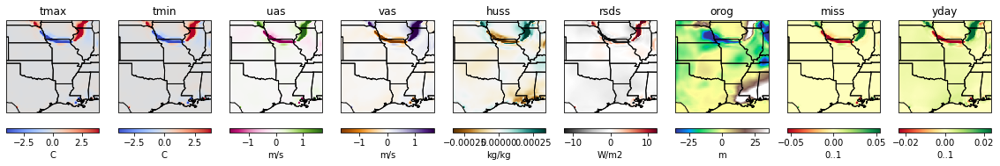

FILTER 156


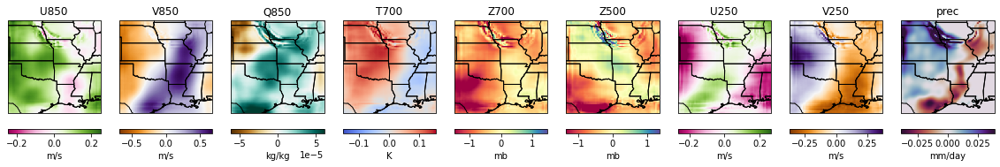

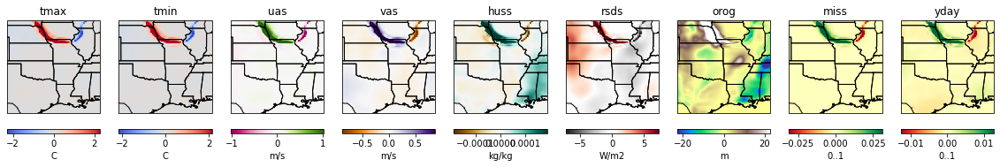

FILTER 323


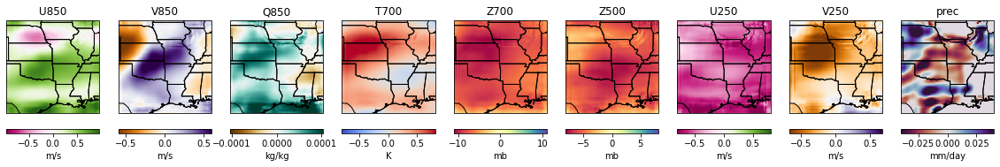

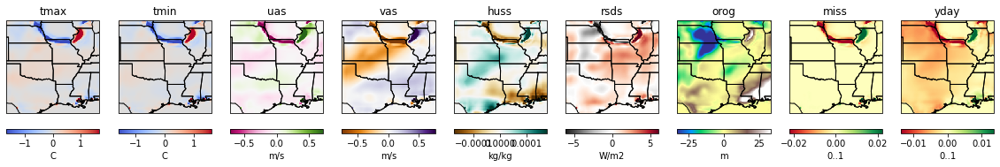

In [83]:
# substituting single filters from MPI day front)
varnames = ['U850', 'V850', 'Q850', 'T700', 'Z700', 'Z500', 'U250', 'V250', 'prec', 'tmax', 'tmin', 'uas', 'vas', 'huss', 'rsds', 'orog','miss','yday']
for ii in [222, 261]:
    print('\nSTORM INDEX:', ii)
    input_chunk = samples_mpi[ii:ii+1, :, 58:58+64, 110:110+64]
    input_chunk[np.isnan(input_chunk)] = 0.   # extended surface domain has nan's at bottom

    for fii in range(15):
        #xx = err1_list_era[top15_filters_era[fii]]
        ff= top15_filters_era[fii]
        xx = calc_filter_variance(input_chunk, bn_mean_mpi, gen_a, ff)

        vmax = [-9999 for y in range(18)]  
        vmin = [9999 for y in range(18)]           
        vmin_temp = [xx[3][ii].mean() - xx[3][ii].std()*2 for ii in range(18)]
        vmax_temp = [xx[3][ii].mean() + xx[3][ii].std()*2 for ii in range(18)]

        vmin = [min(vmin[ii], vmin_temp[ii]) for ii in range(18)]
        vmax = [max(vmax[ii], vmax_temp[ii]) for ii in range(18)]


        print("FILTER", top15_filters_era[fii])
        svars = [0,1,2,3,4,5,6,7,8]
        plot_9v_192x256(xx[3], None, vmin, vmax, svars=svars, xoff=110, yoff=58)
        svars = [9,10,11,12,13,14,15,16,17]
        plot_9v_192x256(xx[3], None, vmin, vmax, svars=svars, xoff=110, yoff=58)


        #plot_9v_192x256_abs(avg_decoded_denorm, None, vmin, vmax, svars=svars, xoff=110, yoff=58)
        #svars = [8,9,10,11,12,13,14,15,16]
        #plot_9v_192x256_abs(front_decoded_denorm, None, vmin, vmax, svars=svars, xoff=110, yoff=58)
        #plot_9v_192x256_abs(avg_decoded_denorm, None, vmin, vmax, svars=svars, xoff=110, yoff=58)

